In [1]:
#Импорт необходимых модулей
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from tqdm import tqdm
from celluloid import Camera
import plotly.graph_objects as go
import warnings

In [2]:
#Считывание таблицы данных
df_P = pd.read_excel("database/f221117_133630-P.xlsx", header=None)
df_P

,0,1,2,3,4,5,6,7,8,9,...,156,157,158,159,160,161,162,163,164,165
0,Kmob,52.911957,52.920532,52.906242,52.914818,52.891964,52.923386,52.900532,52.877701,52.939129,...,52.916988,52.914127,52.911274,52.896992,52.877010,52.908417,52.916283,52.950596,52.950596,52.830688
1,AdcFreq,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,...,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000
2,SpeStart,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,...,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
3,TimeOffset,84.095268,245.807144,406.653015,567.119087,731.014236,907.766060,1046.712734,1208.694004,1368.904362,...,24945.879543,25111.731113,25266.114567,25426.178257,25586.422741,25746.446316,25912.135891,26067.210857,26227.024670,26388.482548
4,0,-7.000000,-9.000000,-7.000000,-16.000000,-15.000000,-13.000000,-21.000000,-21.000000,-26.000000,...,-26.000000,-23.000000,-17.000000,-27.000000,-27.000000,-31.000000,-31.000000,-29.000000,-21.000000,-24.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999,1995,-130.000000,-135.000000,-139.000000,-141.000000,-138.000000,-135.000000,-133.000000,-135.000000,-138.000000,...,-110.000000,-101.000000,-102.000000,-102.000000,-107.000000,-111.000000,-117.000000,-121.000000,-124.000000,-121.000000
2000,1996,-124.000000,-128.000000,-130.000000,-135.000000,-132.000000,-130.000000,-126.000000,-127.000000,-131.000000,...,-114.000000,-107.000000,-108.000000,-108.000000,-110.000000,-113.000000,-120.000000,-121.000000,-124.000000,-122.000000
2001,1997,-107.000000,-113.000000,-116.000000,-121.000000,-121.000000,-123.000000,-118.000000,-120.000000,-121.000000,...,-110.000000,-102.000000,-102.000000,-105.000000,-105.000000,-110.000000,-117.000000,-116.000000,-117.000000,-115.000000
2002,1998,-95.000000,-101.000000,-104.000000,-110.000000,-110.000000,-115.000000,-112.000000,-115.000000,-117.000000,...,-107.000000,-102.000000,-102.000000,-105.000000,-105.000000,-110.000000,-115.000000,-114.000000,-116.000000,-114.000000


In [3]:
#Разбиение данных на 3 таблицы
#Значения времени(X_P)
X_P = df_P.iloc[3, 1:]
frames_ammount = X_P.shape[0]
#Значения компенсационного заряда(Y_P)
Y_P = df_P.iloc[4:, 0]
#Значения ионного тока(Z_P)
Z_P = df_P.iloc[4:, 1:]
print(f"X:{X_P.shape}\nY:{Y_P.shape}\nZ{Z_P.shape}")
print(Z_P.reset_index(drop=True))

X:(165,)
Y:(2000,)
Z(2000, 165)
        1      2      3      4      5      6      7      8      9      10   \
0      -7.0   -9.0   -7.0  -16.0  -15.0  -13.0  -21.0  -21.0  -26.0  -21.0   
1     -27.0  -27.0  -27.0  -33.0  -29.0  -23.0  -29.0  -27.0  -32.0  -26.0   
2     -19.0  -23.0  -23.0  -27.0  -23.0  -16.0  -23.0  -21.0  -26.0  -20.0   
3     -27.0  -29.0  -24.0  -24.0  -21.0  -15.0  -19.0  -18.0  -21.0  -15.0   
4     -30.0  -32.0  -27.0  -27.0  -24.0  -18.0  -21.0  -16.0  -23.0  -16.0   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
1995 -130.0 -135.0 -139.0 -141.0 -138.0 -135.0 -133.0 -135.0 -138.0 -137.0   
1996 -124.0 -128.0 -130.0 -135.0 -132.0 -130.0 -126.0 -127.0 -131.0 -129.0   
1997 -107.0 -113.0 -116.0 -121.0 -121.0 -123.0 -118.0 -120.0 -121.0 -118.0   
1998  -95.0 -101.0 -104.0 -110.0 -110.0 -115.0 -112.0 -115.0 -117.0 -117.0   
1999  -92.0  -96.0 -101.0 -109.0 -109.0 -113.0 -110.0 -112.0 -114.0 -114.0   

      ...    156    157    158 

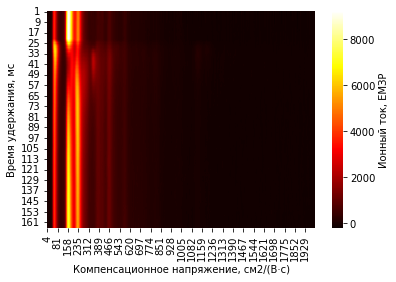

In [4]:
#Отрисовка карты нагрева первоначальных данных
fig, ax = plt.subplots()
raw_heatmap = sns.heatmap(Z_P.transpose(), cmap="hot", cbar_kws={'label': 'Ионный ток, ЕМЗР'}, ax=ax)
raw_heatmap.set(xlabel=('Компенсационное напряжение, см2/(В·c)'),
ylabel=('Время удержания, мс'))
fig.savefig('results/raw_heatmap.png')

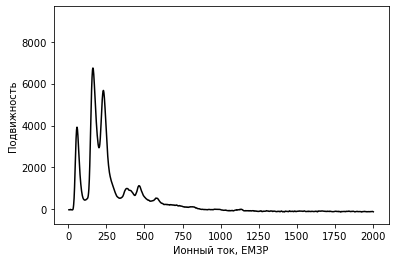

In [5]:
fig, ax = plt.subplots()
camera = Camera(fig)
plt.xlabel('Ионный ток, ЕМЗР')
plt.ylabel('Подвижность')
for i in range(125):
    plt.plot(Z_P.iloc[:,i], color = "black")
    camera.snap()

animation = camera.animate()
animation.save('results/anim_raw_data.gif', writer='pillow')

In [11]:
surf = go.Figure(data=[go.Surface(z=Z_P.values)])
surf.add_annotation(ax = X_P)
surf.update_layout(autosize=False,
                scene = dict(
                    xaxis_title='Something',
                    yaxis_title='Time',
                    zaxis_title='Z AXIS TITLE'),
                  width=1000, height=1000,
                  margin=dict(l=65, r=50, b=65, t=90))

In [6]:
from scipy.linalg import cholesky
from scipy import sparse
from scipy.sparse.linalg import spsolve
def baseline_arPLS(y, lam=1e4, ratio=0.05, itermax=100):
    N = len(y)
    D = sparse.eye(N, format='csc')
    D = D[1:] - D[:-1]
    D = D[1:] - D[:-1]
    H = lam * D.T * D
    w = np.ones(N)
    for i in range(itermax):
        W = sparse.diags(w, 0, shape=(N, N))
        WH = sparse.csc_matrix(W + H)
        C = sparse.csc_matrix(cholesky(WH.todense()))
        z = spsolve(C, spsolve(C.T, w * y))
        d = y - z
        dn = d[d < 0]
        m = np.mean(dn)
        s = np.std(dn)
        wt = 1. / (1 + np.exp(2 * (d - (2 * s - m)) / s))
        if np.linalg.norm(w - wt) / np.linalg.norm(w) < ratio:
            break
        w = wt
    return z

[ -24.  -28.  -31. ... -114. -114. -115.]


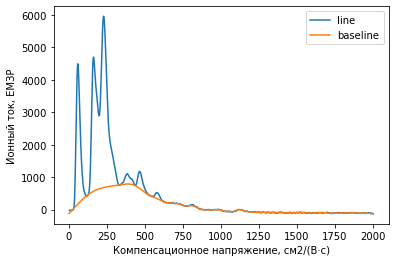

In [16]:
warnings.filterwarnings('ignore')

frame = 70
fig, ax = plt.subplots()
plt.plot(Z_P.iloc[:, frame], label='line')
print(Z_P.iloc[:, 100].to_numpy())
baseline = baseline_arPLS(Z_P.iloc[:, frame].to_numpy(), 10**4, 0.01)
plt.plot([i for i in range(0, 2000)], baseline_Zi, label='baseline')
plt.xlabel('Компенсационное напряжение, см2/(В·c)')
plt.ylabel('Ионный ток, ЕМЗР')
ax.legend()
fig.savefig(f'results/frame_{frame}_with_baseline.png')


plt.show()

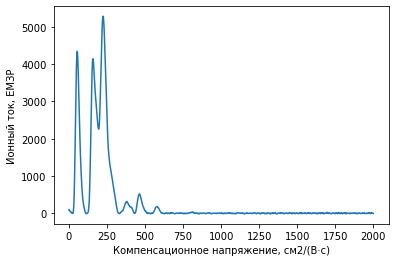

In [14]:
fig, ax = plt.subplots()
plt.plot([i for i in range(0, 2000)], Z_P.iloc[:, 70] - baseline_Zi)
plt.xlabel('Компенсационное напряжение, см2/(В·c)')
plt.ylabel('Ионный ток, ЕМЗР')
plt.show()
fig.savefig(f'results/processed_{frame}_frame.png')

In [15]:
arPLS_dz = []
for i in tqdm(range(150)):
    new_line = Z_P.iloc[:,i] - baseline_arPLS(Z_P.iloc[:, i].to_numpy(), 10**4, 0.01)
    arPLS_dz.append(new_line.to_numpy())

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [05:03<00:00,  2.02s/it]


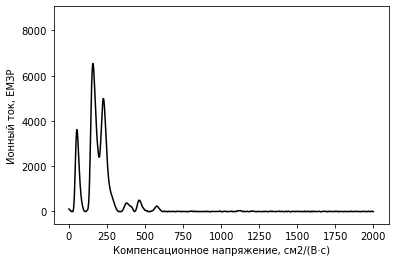

In [16]:
fig, ax = plt.subplots()
camera = Camera(fig)
plt.xlabel('Компенсационное напряжение, см2/(В·c)')
plt.ylabel('Ионный ток, ЕМЗР')
for i in arPLS_dz:
    plt.plot(i, color = "black")
    camera.snap()

animation = camera.animate()
animation.save('results/anim_processed_data.gif', writer = 'pillow')

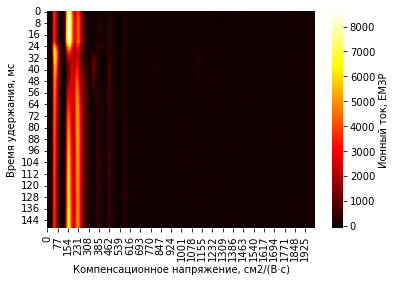

In [17]:
fig, ax = plt.subplots()
arPLS_Z = pd.DataFrame(arPLS_dz)
processed_heatmap = sns.heatmap(arPLS_Z, cmap="hot", cbar_kws={'label': 'Ионный ток, ЕМЗР'}, ax=ax)
processed_heatmap.set(xlabel=('Компенсационное напряжение, см2/(В·c)'),
ylabel=('Время удержания, мс'))
fig.savefig('results/processed_heatmap.png')

In [18]:
arPLS_Z.to_csv('results/arPLS_Z.csv')
X_P.to_csv('results/X.csv')
Y_P.to_csv('results/Y.csv')
Z_P.to_csv('results/Z.csv')